In [1]:
# ViTPose
import torch
import requests
import numpy as np

from PIL import Image

from transformers import AutoProcessor, RTDetrForObjectDetection, VitPoseForPoseEstimation

device = "cuda" if torch.cuda.is_available() else "cpu"


D:\dev\envs\hakiko-cyb\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
image = Image.open("img_2.png")

In [3]:
# You can choose any detector of your choice
person_image_processor = AutoProcessor.from_pretrained("PekingU/rtdetr_r50vd_coco_o365")
person_model = RTDetrForObjectDetection.from_pretrained("PekingU/rtdetr_r50vd_coco_o365", device_map=device)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
D:\dev\envs\hakiko-cyb\Lib\site-packages\torch\utils\cpp_extension.py:414: UserWarning: Error checking compiler version for cl: [WinError 2] A rendszer nem találja a megadott fájlt
  warnings.warn(f'Error checking compiler version for {compiler}: {error}')
D:\dev\envs\hakiko-cyb\Lib\site-packages\torch\utils\cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Could not load the custom kernel for multi-scale deformable attention: Command '['where', 'cl']' returned non-zero exit status 1.
Could not load the c

In [4]:
inputs = person_image_processor(images=image, return_tensors="pt").to(device)

In [5]:
with torch.no_grad():
    outputs = person_model(**inputs)

results = person_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.3
)
result = results[0]  # take first image results

In [6]:
# Human label refers 0 index in COCO dataset
person_boxes = result["boxes"][result["labels"] == 0]
person_boxes = person_boxes.cpu().numpy()

# Convert boxes from VOC (x1, y1, x2, y2) to COCO (x1, y1, w, h) format
person_boxes[:, 2] = person_boxes[:, 2] - person_boxes[:, 0]
person_boxes[:, 3] = person_boxes[:, 3] - person_boxes[:, 1]

# ------------------------------------------------------------------------
# Stage 2. Detect keypoints for each person found
# ------------------------------------------------------------------------

image_processor = AutoProcessor.from_pretrained("usyd-community/vitpose-base-simple")
model = VitPoseForPoseEstimation.from_pretrained("usyd-community/vitpose-base-simple", device_map=device)

inputs = image_processor(image, boxes=[person_boxes], return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)

pose_results = image_processor.post_process_pose_estimation(outputs, boxes=[person_boxes])
image_pose_result = pose_results[0]  # results for first image

C:\Users\keret\AppData\Local\Temp\ipykernel_15808\4122642002.py:89: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  scores = np.array(pose_result["scores"])
C:\Users\keret\AppData\Local\Temp\ipykernel_15808\4122642002.py:90: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  keypoints = np.array(pose_result["keypoints"])


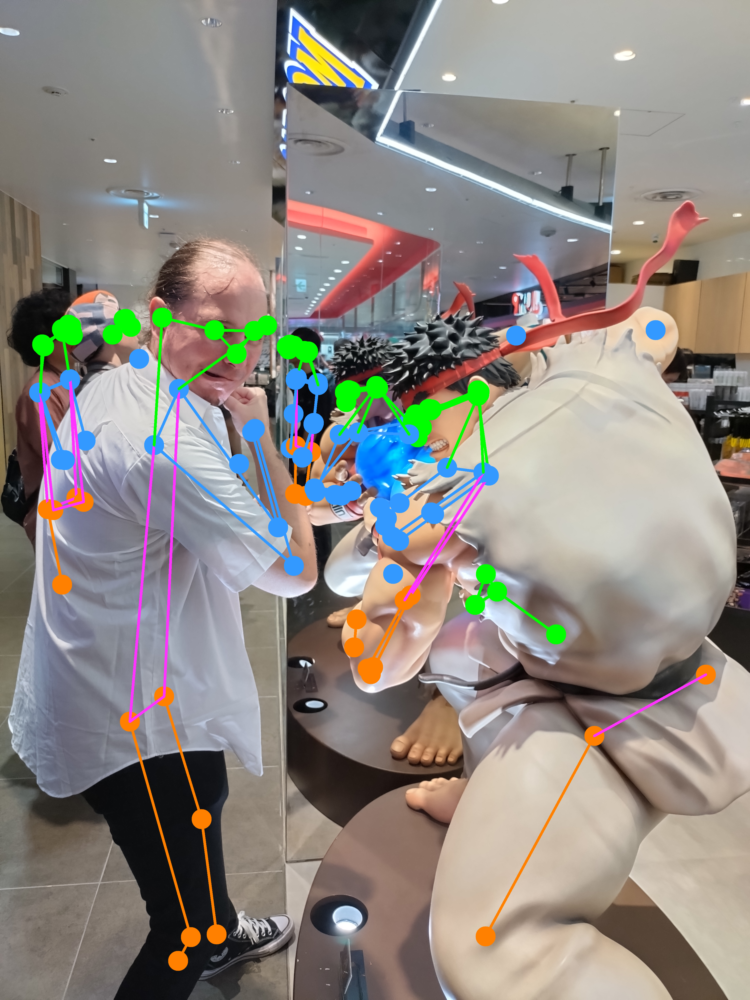

In [9]:
import math
import cv2

def draw_points(image, keypoints, scores, pose_keypoint_color, keypoint_score_threshold, radius, show_keypoint_weight):
    if pose_keypoint_color is not None:
        assert len(pose_keypoint_color) == len(keypoints)
    for kid, (kpt, kpt_score) in enumerate(zip(keypoints, scores)):
        x_coord, y_coord = int(kpt[0]), int(kpt[1])
        if kpt_score > keypoint_score_threshold:
            color = tuple(int(c) for c in pose_keypoint_color[kid])
            if show_keypoint_weight:
                cv2.circle(image, (int(x_coord), int(y_coord)), radius, color, -1)
                transparency = max(0, min(1, kpt_score))
                cv2.addWeighted(image, transparency, image, 1 - transparency, 0, dst=image)
            else:
                cv2.circle(image, (int(x_coord), int(y_coord)), radius, color, -1)

def draw_links(image, keypoints, scores, keypoint_edges, link_colors, keypoint_score_threshold, thickness, show_keypoint_weight, stick_width = 2):
    height, width, _ = image.shape
    if keypoint_edges is not None and link_colors is not None:
        assert len(link_colors) == len(keypoint_edges)
        for sk_id, sk in enumerate(keypoint_edges):
            x1, y1, score1 = (int(keypoints[sk[0], 0]), int(keypoints[sk[0], 1]), scores[sk[0]])
            x2, y2, score2 = (int(keypoints[sk[1], 0]), int(keypoints[sk[1], 1]), scores[sk[1]])
            if (
                    x1 > 0
                    and x1 < width
                    and y1 > 0
                    and y1 < height
                    and x2 > 0
                    and x2 < width
                    and y2 > 0
                    and y2 < height
                    and score1 > keypoint_score_threshold
                    and score2 > keypoint_score_threshold
            ):
                color = tuple(int(c) for c in link_colors[sk_id])
                if show_keypoint_weight:
                    X = (x1, x2)
                    Y = (y1, y2)
                    mean_x = np.mean(X)
                    mean_y = np.mean(Y)
                    length = ((Y[0] - Y[1]) ** 2 + (X[0] - X[1]) ** 2) ** 0.5
                    angle = math.degrees(math.atan2(Y[0] - Y[1], X[0] - X[1]))
                    polygon = cv2.ellipse2Poly(
                        (int(mean_x), int(mean_y)), (int(length / 2), int(stick_width)), int(angle), 0, 360, 1
                    )
                    cv2.fillConvexPoly(image, polygon, color)
                    transparency = max(0, min(1, 0.5 * (keypoints[sk[0], 2] + keypoints[sk[1], 2])))
                    cv2.addWeighted(image, transparency, image, 1 - transparency, 0, dst=image)
                else:
                    cv2.line(image, (x1, y1), (x2, y2), color, thickness=thickness)


# Note: keypoint_edges and color palette are dataset-specific
keypoint_edges = model.config.edges

palette = np.array(
    [
        [255, 128, 0],
        [255, 153, 51],
        [255, 178, 102],
        [230, 230, 0],
        [255, 153, 255],
        [153, 204, 255],
        [255, 102, 255],
        [255, 51, 255],
        [102, 178, 255],
        [51, 153, 255],
        [255, 153, 153],
        [255, 102, 102],
        [255, 51, 51],
        [153, 255, 153],
        [102, 255, 102],
        [51, 255, 51],
        [0, 255, 0],
        [0, 0, 255],
        [255, 0, 0],
        [255, 255, 255],
    ]
)

link_colors = palette[[0, 0, 0, 0, 7, 7, 7, 9, 9, 9, 9, 9, 16, 16, 16, 16, 16, 16, 16]]
keypoint_colors = palette[[16, 16, 16, 16, 16, 9, 9, 9, 9, 9, 9, 0, 0, 0, 0, 0, 0]]

numpy_image = np.array(image)

for pose_result in image_pose_result:
    scores = np.array(pose_result["scores"])
    keypoints = np.array(pose_result["keypoints"])

    # draw each point on image
    draw_points(numpy_image, keypoints, scores, keypoint_colors, keypoint_score_threshold=0.3, radius=40, show_keypoint_weight=False)

    # draw links
    draw_links(numpy_image, keypoints, scores, keypoint_edges, link_colors, keypoint_score_threshold=0.3, thickness=10, show_keypoint_weight=False)

pose_image = Image.fromarray(numpy_image)
pose_image

# Video input

In [10]:
# Video input
path = "rotated_pose_recording.avi"


In [14]:
import numpy as np

In [16]:
# Open the video and infer on each frame
cap = cv2.VideoCapture(path)
while cap.isOpened():
    ret, frame = cap.read()
    np_frame = np.array(frame)
    inputs = person_image_processor(images=np_frame, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = person_model(**inputs)

    results = person_image_processor.post_process_object_detection(
        outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.3
    )
    result = results[0]  # take first image results
    # Human label refers 0 index in COCO dataset
    person_boxes = result["boxes"][result["labels"] == 0]
    person_boxes = person_boxes.cpu().numpy()

    # Convert boxes from VOC (x1, y1, x2, y2) to COCO (x1, y1, w, h) format
    person_boxes[:, 2] = person_boxes[:, 2] - person_boxes[:, 0]
    person_boxes[:, 3] = person_boxes[:, 3] - person_boxes[:, 1]

    # ------------------------------------------------------------------------
    # Stage 2. Detect keypoints for each person found
    # ------------------------------------------------------------------------

    image_processor = AutoProcessor.from_pretrained("usyd-community/vitpose-base-simple")
    model = VitPoseForPoseEstimation.from_pretrained("usyd-community/vitpose-base-simple", device_map=device)

    inputs = image_processor(image, boxes=[person_boxes], return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    pose_results = image_processor.post_process_pose_estimation(outputs, boxes=[person_boxes])
    image_pose_result = pose_results[0]  # results for first image
    # Show thre results on cv2
    numpy_image = np.array(frame)
    for pose_result in image_pose_result:
        scores = np.array(pose_result["scores"])
        keypoints = np.array(pose_result["keypoints"])

        # draw each point on image
        draw_points(numpy_image, keypoints, scores, keypoint_colors, keypoint_score_threshold=0.3, radius=10, show_keypoint_weight=False)

        # draw links
        draw_links(numpy_image, keypoints, scores, keypoint_edges, link_colors, keypoint_score_threshold=0.3, thickness=2, show_keypoint_weight=False)
    pose_image = Image.fromarray(numpy_image)
    cv2.imshow("Pose", np.array(pose_image))
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break


C:\Users\keret\AppData\Local\Temp\ipykernel_15808\2150330748.py:39: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  scores = np.array(pose_result["scores"])
C:\Users\keret\AppData\Local\Temp\ipykernel_15808\2150330748.py:40: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  keypoints = np.array(pose_result["keypoints"])


KeyboardInterrupt: 